<a href="https://colab.research.google.com/github/Jaguar838/stock-markets-analytics-zoomcamp/blob/main/HW/hw-03/Module_3_Colab_Time_Series_Modeling_ua.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# !pip install yfinance

In [2]:
# read files shared via google-drive-link
# https://stackoverflow.com/questions/62759748/downloading-data-from-a-shared-google-drive-link-in-google-colab

# !pip uninstall gdown -y && pip install gdown
!gdown -V

gdown 4.7.3 at /usr/local/lib/python3.10/dist-packages


In [3]:
# IMPORTS
import numpy as np
import pandas as pd

#Fin Data Sources
import yfinance as yf
import pandas_datareader as pdr

#Data viz
import plotly.graph_objs as go
import plotly.graph_objects as go
import plotly.express as px

import time
from datetime import date

# for graphs
import matplotlib.pyplot as plt

# 0) Набір даних для моделювання: Фінальна підготовка

## 0.1) Імпорт даних з Drive та визначення наборів змінних
* автоматизована версія потребує щоденного оновлення файлів/баз даних

In [7]:
# https://stackoverflow.com/questions/62759748/downloading-data-from-a-shared-google-drive-link-in-google-colab
# усічені дані з Модуля 2: https://drive.google.com/file/d/1m3Qisfs2XfWk6Sw_Uk5kHLWqwQ0q8SKb/view?usp=sharing

!gdown https://drive.google.com/file/d/1m3Qisfs2XfWk6Sw_Uk5kHLWqwQ0q8SKb/view?usp=sharing --fuzzy -O /content/

!gdown https://drive.google.com/file/d/1kNWWPi49td0EZhmi6LzNCa2ssC5IUxHP/view?usp=sharing --fuzzy -O /content/




Downloading...
From: https://drive.google.com/uc?id=1m3Qisfs2XfWk6Sw_Uk5kHLWqwQ0q8SKb
To: /content/stocks_df_combined_trunc_2014_2023.parquet.brotli
100% 47.3M/47.3M [00:02<00:00, 20.0MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1kNWWPi49td0EZhmi6LzNCa2ssC5IUxHP
From (redirected): https://drive.google.com/uc?id=1kNWWPi49td0EZhmi6LzNCa2ssC5IUxHP&confirm=t&uuid=461ebb59-2dcc-44c5-bdee-7840a5a16d77
To: /content/stocks_df_combined_2024_05_07.parquet.brotli
100% 119M/119M [00:01<00:00, 111MB/s]


In [9]:
# Скорочений
df = pd.read_parquet("/content/stocks_df_combined_trunc_2014_2023.parquet.brotli", )

# повний набір даних для 33 акцій
df_full = pd.read_parquet("/content/stocks_df_combined_2024_05_07.parquet.brotli", )

In [10]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 221142 entries, 0 to 5426
Columns: 202 entries, Open to growth_btc_usd_365d
dtypes: datetime64[ns](3), float64(128), int32(64), int64(5), object(2)
memory usage: 288.5+ MB


In [11]:
df_full.keys()

Index(['Open', 'High', 'Low', 'Close', 'Adj Close_x', 'Volume', 'Ticker',
       'Year', 'Month', 'Weekday',
       ...
       'growth_brent_oil_7d', 'growth_brent_oil_30d', 'growth_brent_oil_90d',
       'growth_brent_oil_365d', 'growth_btc_usd_1d', 'growth_btc_usd_3d',
       'growth_btc_usd_7d', 'growth_btc_usd_30d', 'growth_btc_usd_90d',
       'growth_btc_usd_365d'],
      dtype='object', length=202)

In [12]:
# показники зростання (але не майбутнього зростання)
GROWTH = [g for g in df_full.keys() if (g.find('growth_')==0)&(g.find('future')<0)]
GROWTH

['growth_1d',
 'growth_3d',
 'growth_7d',
 'growth_30d',
 'growth_90d',
 'growth_365d',
 'growth_dax_1d',
 'growth_dax_3d',
 'growth_dax_7d',
 'growth_dax_30d',
 'growth_dax_90d',
 'growth_dax_365d',
 'growth_snp500_1d',
 'growth_snp500_3d',
 'growth_snp500_7d',
 'growth_snp500_30d',
 'growth_snp500_90d',
 'growth_snp500_365d',
 'growth_dji_1d',
 'growth_dji_3d',
 'growth_dji_7d',
 'growth_dji_30d',
 'growth_dji_90d',
 'growth_dji_365d',
 'growth_epi_1d',
 'growth_epi_3d',
 'growth_epi_7d',
 'growth_epi_30d',
 'growth_epi_90d',
 'growth_epi_365d',
 'growth_gold_1d',
 'growth_gold_3d',
 'growth_gold_7d',
 'growth_gold_30d',
 'growth_gold_90d',
 'growth_gold_365d',
 'growth_wti_oil_1d',
 'growth_wti_oil_3d',
 'growth_wti_oil_7d',
 'growth_wti_oil_30d',
 'growth_wti_oil_90d',
 'growth_wti_oil_365d',
 'growth_brent_oil_1d',
 'growth_brent_oil_3d',
 'growth_brent_oil_7d',
 'growth_brent_oil_30d',
 'growth_brent_oil_90d',
 'growth_brent_oil_365d',
 'growth_btc_usd_1d',
 'growth_btc_usd_3d',


In [13]:
# залишивши тільки Volume ==> згенерувати ln(Volume)
OHLCV = ['Open','High','Low','Close','Adj Close_x','Volume']

In [14]:
CATEGORICAL = ['Month', 'Weekday', 'Ticker', 'ticker_type']

In [15]:
TO_PREDICT = [g for g in df_full.keys() if (g.find('future')>=0)]
TO_PREDICT

['growth_future_5d', 'is_positive_growth_5d_future']

In [16]:
TO_DROP = ['Year','Date','index_x', 'index_y', 'index', 'Quarter','Adj Close_y'] + CATEGORICAL + OHLCV
TO_DROP

['Year',
 'Date',
 'index_x',
 'index_y',
 'index',
 'Quarter',
 'Adj Close_y',
 'Month',
 'Weekday',
 'Ticker',
 'ticker_type',
 'Open',
 'High',
 'Low',
 'Close',
 'Adj Close_x',
 'Volume']

In [17]:
# давайте визначимо більше кастомних числових функцій
df_full['ln_volume'] = df_full.Volume.apply(lambda x: np.log(x))

In [18]:
# функції, визначені вручну
CUSTOM_NUMERICAL = ['SMA10', 'SMA20', 'growing_moving_average', 'high_minus_low_relative','volatility', 'ln_volume']

In [19]:
# All Supported Ta-lib indicators: https://github.com/TA-Lib/ta-lib-python/blob/master/docs/funcs.md

TECHNICAL_INDICATORS = [
    'adx', # Середній напрямковий індекс: вимірює силу тренду
    'adxr', # Середній спрямований індекс оцінки: згладжений ADX
    'apo', # Осцилятор цінового каналу: різниця між короткостроковим і довгостроковим експоненціальним ковзаючим середнім
    'aroon_1', # Aroon (Up): кількість періодів з моменту досягнення найвищої ціни
    'aroon_2', # Aroon (Down): кількість періодів з моменту досягнення найнижчої ціни
    'aroonosc', # Осцилятор Aroon: різниця між Aroon (Up) і Aroon (Down)
    'bop', # Баланс сили: співвідношення між купівельним та продажним тиском
    'cci', # Індекс товарного каналу: визначає відхилення ціни від її середнього значення
    'cmo', # Осцилятор Chande Momentum: показник моменту
    'dx', # Напрямковий індекс: частина ADX, вимірює силу тренду
    'macd', # MACD: різниця між короткостроковим і довгостроковим експоненціальним ковзаючим середнім
    'macdsignal', # Сигнальна лінія MACD: ковзаюче середнє MACD
    'macdhist', # Історія MACD: різниця між MACD і сигнальною лінією
    'macd_ext', # Розширений MACD: MACD з параметрами, що налаштовуються
    'macdsignal_ext', # Розширена сигнальна лінія MACD: сигнальна лінія MACD з параметрами, що налаштовуються
    'macdhist_ext', # Розширена історія MACD: різниця між розширеним MACD і розширеною сигнальною лінією
    'macd_fix', # Фіксований MACD: MACD з фіксованими параметрами
    'macdsignal_fix', # Фіксована сигнальна лінія MACD: сигнальна лінія MACD з фіксованими параметрами
    'macdhist_fix', # Фіксована історія MACD: різниця між фіксованим MACD і фіксованою сигнальною лінією
    'mfi', # Індекс грошових потоків: вимірює приплив і відтік грошей в актив
    'minus_di', # Мінус спрямковий індекс: частина ADX, що вимірює силу низхідного тренду
    'mom', # Моментум: різниця між поточною ціною і ціною n періодів назад
    'plus_di', # Плюс спрямковий індекс: частина ADX, що вимірює силу висхідного тренду
    'dm', # Напрямковий рух: різниця між плюс DI і мінус DI
    'ppo', # Відсотковий осцилятор цін: різниця між короткостроковим і довгостроковим експоненціальним ковзаючим середнім у відсотках
    'roc', # Швидкість зміни: відношення різниці між поточною ціною і ціною n періодів назад до ціни n періодів назад
    'rocp', # Відсоток зміни: різниця між поточною ціною і ціною n періодів назад у відсотках
    'rocr', # Співвідношення зміни: співвідношення між поточною ціною і ціною n періодів назад
    'rocr100', # Відсоткове співвідношення зміни: співвідношення між поточною ціною і ціною n періодів назад у відсотках
    'rsi', # Індекс відносної сили: вимірює швидкість і зміну цінових рухів
    'slowk', # Повільний K: частина стохастичного осцилятора, повільна лінія K
    'slowd', # Повільний D: частина стохастичного осцилятора, повільна лінія D
    'fastk', # Швидкий K: частина стохастичного осцилятора, швидка лінія K
    'fastd', # Швидкий D: частина стохастичного осцилятора, швидка лінія D
    'fastk_rsi', # Швидкий K RSI: швидкий K, розрахований на основі RSI
    'fastd_rsi', # Швидкий D RSI: швидкий D, розрахований на основі RSI
    'trix', # TRIX: потрійне експоненціальне ковзаюче середнє
    'ultosc', # Ультимативний осцилятор: комбінує кілька періодів для вимірювання моменту
    'willr', # Відсотковий діапазон Вільямса: показує рівень ціни в порівнянні з високими і низькими цінами за певний період
    'ad', # Накопичення/Розподіл: вимірює потоки грошових коштів на основі цін і обсягів
    'adosc', # Осцилятор накопичення/розподілу: вимірює силу накопичення і розподілу на основі обсягів
    'obv', # Балансовий обсяг: вимірює кумулятивний обсяг торгів, який додається чи віднімається в залежності від цінових змін
    'atr', # Середній справжній діапазон: вимірює волатильність активу
    'natr', # Нормалізований середній справжній діапазон: нормалізований ATR, виражений у відсотках
    'ht_dcperiod', # Преобразование Гильберта Довжина циклу: вимірює довжину домінуючого циклу за допомогою Хілбертового перетворення
    'ht_dcphase', # Преобразование Гильберта Фаза циклу: вимірює фазу домінуючого циклу за допомогою Хілбертового перетворення
    'ht_phasor_inphase', # Преобразование Гильберта Фазор у фазі: частина фазора Хілбертового перетворення, яка знаходиться у фазі
    'ht_phasor_quadrature', # Преобразование Гильберта Фазор квадратури: частина фазора Хілбертового перетворення, яка знаходиться у квадранті
    'ht_sine_sine', # Преобразование Гильберта Синус: синусова компонента Хілбертового перетворення
    'ht_sine_leadsine', # Преобразование Гильберта Випереджаючий синус: випереджаюча синусова компонента Хілбертового перетворення
    'ht_trendmod', # Преобразование Гильберта Трендовий режим: визначає, чи перебуває ринок у трендовому чи циклічному режимі
    'avgprice', # Середня ціна: середнє значення (висока ціна + низька ціна + закриття + відкриття) / 4
    'medprice', # Медійна ціна: середнє значення (висока ціна + низька ціна) / 2
    'typprice', # Типова ціна: середнє значення (висока ціна + низька ціна + закриття) / 3
    'wclprice' # Виважена ціна закриття: (висока ціна + низька ціна + 2 * закриття) / 4
]

In [20]:
TECHNICAL_PATTERNS = [g for g in df_full.keys() if g.find('cdl')>=0]
print(f'Technical patterns count = {len(TECHNICAL_PATTERNS)}, examples = {TECHNICAL_PATTERNS[0:5]}')


Technical patterns count = 61, examples = ['cdl2crows', 'cdl3blackrows', 'cdl3inside', 'cdl3linestrike', 'cdl3outside']


In [21]:
MACRO = ['gdppot_us_yoy', 'gdppot_us_qoq', 'cpi_core_yoy', 'cpi_core_mom', 'FEDFUNDS',
 'DGS1', 'DGS5', 'DGS10']

In [22]:
NUMERICAL = GROWTH + TECHNICAL_INDICATORS + TECHNICAL_PATTERNS + CUSTOM_NUMERICAL + MACRO

In [23]:
# ПЕРЕВІРКА: ІНШИХ ІНДИКАТОРІВ НЕ ЗАЛИШИЛОСЯ
OTHER = [k for k in df_full.keys() if k not in OHLCV + CATEGORICAL + NUMERICAL + TO_DROP]
OTHER

['growth_future_5d', 'is_positive_growth_5d_future']

In [24]:
df_full.Ticker.nunique()

33

In [25]:
# тикери, дата min-max, кількість щоденних спостережень
df_full.groupby(['Ticker'])['Date'].agg(['min','max','count'])

,min,max,count
Ticker,,,
AAPL,1980-12-12,2024-05-07,10941
ACN,2001-07-19,2024-05-07,5736
AMZN,1997-05-15,2024-05-07,6789
ASML,1995-03-15,2024-05-07,7338
AVGO,2009-08-06,2024-05-07,3713
BHARTIARTL.NS,2002-07-01,2024-05-07,5424
BRK-B,1996-05-09,2024-05-07,7046
CDI.PA,1992-01-27,2024-05-07,8328
GOOG,2004-08-19,2024-05-07,4963


In [26]:
# усічений df_full з даними за 25 років (і визначеними змінними зростання)
df = df_full[df_full.Date>='2000-01-01']
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 182675 entries, 3490 to 5426
Columns: 203 entries, Open to ln_volume
dtypes: datetime64[ns](3), float64(129), int32(64), int64(5), object(2)
memory usage: 239.7+ MB


In [27]:
# давайте подивимось на кількість та розмір функцій:
df[NUMERICAL].info()

<class 'pandas.core.frame.DataFrame'>
Index: 182675 entries, 3490 to 5426
Columns: 184 entries, growth_1d to DGS10
dtypes: float64(121), int32(62), int64(1)
memory usage: 214.6 MB


## 0.2) [Фрагмент коду 1]Генерування фіктивних моделей

In [28]:
# які категоріальні ознаки?
CATEGORICAL

['Month', 'Weekday', 'Ticker', 'ticker_type']

In [29]:
# фіктивні змінні не генеруються з Date та числових змінних
df.loc[:,'Month'] = df.Month.dt.strftime('%B')
df.loc[:,'Weekday'] = df.Weekday.astype(str)

In [30]:
# Створюємо фіктивні змінні(не потрібно bool, нехай замість нього буде int32)
dummy_variables = pd.get_dummies(df[CATEGORICAL], dtype='int32')

In [31]:
# ЗАВДАННЯ 1: визначити більш категоричні ознаки, наприклад всі комбінації для <вересень+день тижня> (ви побачите, що вересень насправді є важливою фікцією в одній з моделей)

In [32]:
dummy_variables.info()

<class 'pandas.core.frame.DataFrame'>
Index: 182675 entries, 3490 to 5426
Data columns (total 55 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   Month_April           182675 non-null  int32
 1   Month_August          182675 non-null  int32
 2   Month_December        182675 non-null  int32
 3   Month_February        182675 non-null  int32
 4   Month_January         182675 non-null  int32
 5   Month_July            182675 non-null  int32
 6   Month_June            182675 non-null  int32
 7   Month_March           182675 non-null  int32
 8   Month_May             182675 non-null  int32
 9   Month_November        182675 non-null  int32
 10  Month_October         182675 non-null  int32
 11  Month_September       182675 non-null  int32
 12  Weekday_0             182675 non-null  int32
 13  Weekday_1             182675 non-null  int32
 14  Weekday_2             182675 non-null  int32
 15  Weekday_3             182675 non-null 

In [35]:
# отримати імена манекенів у списку
DUMMIES = dummy_variables.keys().to_list()

In [36]:
# Об'єднайте фіктивні змінні з оригінальним фреймом даних
df_with_dummies = pd.concat([df, dummy_variables], axis=1)

In [37]:
df_with_dummies[NUMERICAL+DUMMIES].info()

<class 'pandas.core.frame.DataFrame'>
Index: 182675 entries, 3490 to 5426
Columns: 239 entries, growth_1d to ticker_type_US
dtypes: float64(121), int32(117), int64(1)
memory usage: 253.0 MB


## 0.3) [Code Snippet 2] Correlation analysis
* first approximation of "important" variables correlated with all variables we want to predict (TO_PREDICT)

In [38]:
TO_PREDICT

['growth_future_5d', 'is_positive_growth_5d_future']

In [39]:
corr_is_positive_growth_5d_future = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['is_positive_growth_5d_future']

In [40]:
# create a dataframe for an easy way to sort
corr_is_positive_growth_5d_future_df = pd.DataFrame(corr_is_positive_growth_5d_future)

In [41]:
corr_is_positive_growth_5d_future_df.sort_values(by='is_positive_growth_5d_future').head(5)

,is_positive_growth_5d_future
DGS10,-0.036227
gdppot_us_yoy,-0.034185
gdppot_us_qoq,-0.032138
DGS5,-0.030369
growth_brent_oil_90d,-0.028907


In [42]:
corr_is_positive_growth_5d_future_df.sort_values(by='is_positive_growth_5d_future').tail(8)

,is_positive_growth_5d_future
Month_October,0.020550
growth_btc_usd_7d,0.023084
growth_btc_usd_30d,0.027712
growth_future_5d,0.668535
is_positive_growth_5d_future,1.000000
cdl3starsinsouth,NaN
cdlconcealbabyswall,NaN
cdlmathold,NaN


In [43]:
corr_growth_future_5d = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['growth_future_5d']

In [44]:
corr_growth_future_5d_df = pd.DataFrame(corr_growth_future_5d)

In [45]:
corr_growth_future_5d_df.sort_values(by='growth_future_5d').head(5)

,growth_future_5d
growth_7d,-0.050680
growth_3d,-0.049925
growth_brent_oil_365d,-0.041784
roc,-0.040579
rocr,-0.040579


In [46]:
corr_growth_future_5d_df.sort_values(by='growth_future_5d').tail(8)

,growth_future_5d
growth_btc_usd_3d,0.032382
natr,0.036051
growth_btc_usd_7d,0.036124
is_positive_growth_5d_future,0.668535
growth_future_5d,1.000000
cdl3starsinsouth,NaN
cdlconcealbabyswall,NaN
cdlmathold,NaN


## 0.4) [Code snippet 3] Временное разделение данных примерно за 25 лет (по дате)

In [47]:
def temporal_split(df, min_date, max_date, train_prop=0.7, val_prop=0.15, test_prop=0.15):
    """
    Splits a DataFrame into three buckets based on the temporal order of the 'Date' column.
    Розділяє DataFrame на три сегменти на основі часового порядку стовпця «Дата».

    Args:
        df (DataFrame): Кадр даних, який потрібно розділити.
        min_date (str або Timestamp): мінімальна дата в DataFrame.
        max_date (str або Timestamp): максимальна дата в DataFrame.
        train_prop (float): частка даних для навчальної множини (за замовчуванням: 0.6).
        val_prop (float): Частка даних для набору валідації (за замовчуванням: 0.2).
        test_prop (float): частка даних для тестової множини (за замовчуванням: 0.2).

    Returns:
        DataFrame: Вхідний DataFrame з новим стовпчиком 'split', що вказує на поділ для кожного рядка.
    """
    # Define the date intervals
    train_end = min_date + pd.Timedelta(days=(max_date - min_date).days * train_prop)
    val_end = train_end + pd.Timedelta(days=(max_date - min_date).days * val_prop)

    # Призначити розділені мітки на основі діапазонів дат.
    split_labels = []
    for date in df['Date']:
        if date <= train_end:
            split_labels.append('train')
        elif date <= val_end:
            split_labels.append('validation')
        else:
            split_labels.append('test')

    # Додайте стовпець 'split' до фрейму даних
    df['split'] = split_labels

    return df

In [48]:
min_date_df = df_with_dummies.Date.min()
max_date_df = df_with_dummies.Date.max()

df_with_dummies = temporal_split(df_with_dummies,
                                 min_date = min_date_df,
                                 max_date = max_date_df)

In [49]:
df_with_dummies['split'].value_counts()/len(df_with_dummies)

split
train         0.675834
test          0.163290
validation    0.160876
Name: count, dtype: float64

In [51]:
# усунути проблему "сегментації" (попередження про продуктивність df після багатьох об'єднань і перетворень даних)
new_df = df_with_dummies.copy()

# 1) Modeling: "rule of thumb" or hand-predictions

In [52]:
# let's have a time-series or one ticker
df_nvda = new_df[new_df.Ticker=='NVDA']

In [53]:
fig = px.line(df_nvda, x="Date", y="Adj Close_x", title='NVDA price')
fig.show()

In [56]:
# TRAIN / VALIDATION/ TEST split

# Обчислити довжину кожного розбиття - це не часове розбиття, а на основі кількості спостережень -- "класичне" розбиття без перемішування
total_length = len(df_nvda)
train_length = int(0.8 * total_length)
val_length = int(0.1 * total_length)

# Split the data
train_data = df_nvda.iloc[:train_length]
val_data = df_nvda.iloc[train_length:train_length+val_length]
test_data = df_nvda.iloc[train_length+val_length:]

# Plot the data
fig = px.line(title='NVDA Adj.Close ціна щодня для трьох часових інтервалів Тренування/Випробування/Тестування')
fig.add_scatter(x=train_data['Date'], y=train_data['Adj Close_x'], mode='lines', name='Train', line=dict(color='blue'))
fig.add_scatter(x=val_data['Date'], y=val_data['Adj Close_x'], mode='lines', name='Validation', line=dict(color='orange'))
fig.add_scatter(x=test_data['Date'], y=test_data['Adj Close_x'], mode='lines', name='Test', line=dict(color='green'))

# Update layout to center the title
fig.update_layout(title=dict(x=0.5))

fig.show()

In [57]:
# HIST ON NVDA DATA Train/Test/Validation
import plotly.graph_objects as go

# Plot the data
fig = go.Figure()

# Додати гістограми для кожного розбиття
fig.add_trace(go.Histogram(x=train_data['growth_future_5d'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=val_data['growth_future_5d'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=test_data['growth_future_5d'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Розподіл growth_future_5d для NVIDIA (NVDA) Зростання на Train/Valid/Test наборів')
fig.update_traces(opacity=0.75)

fig.show()


In [58]:
# HIST НА ВСІ ДАНІ Тренування/Тестування/Випробування
# коментар: є деякі викиди і важко порівнювати розподіли
import plotly.graph_objects as go

# Побудуйте графік даних
fig = go.Figure()

# Додати гістограми для кожного розбиття
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='train']['growth_future_5d'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='validation']['growth_future_5d'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='test']['growth_future_5d'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Розподіл growth_future_5d для всіх тикерів Зростання на Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()

In [59]:
# Припустимо, що df_with_dummies - це ваш DataFrame, що містить змінну 'growth_future_5d' та стовпець 'split'

# Створіть гістограму
fig = px.histogram(new_df,
                   x="growth_future_5d",
                   color="split",
                   marginal="box", # or violin, rug
                   )
                # hover_data=new_df.growth_future_5d)


# Показати гістограму
fig.show()

In [60]:
new_df.groupby(by='split')['growth_future_5d'].describe()

,count,mean,std,min,25%,50%,75%,max
split,,,,,,,,
test,29664.0,1.005015,0.040835,0.690219,0.981994,1.004731,1.027028,1.393477
train,123458.0,1.003965,0.053826,0.412383,0.978474,1.003197,1.028354,3.018887
validation,29388.0,1.004417,0.040642,0.668581,0.985343,1.005120,1.023999,1.459217


In [61]:
# це_позитивне_зростання_5d_майбутнє: Лише акції NVDA

# Підрахувати входження 0 та 1 для кожного розбиття
train_counts = train_data['is_positive_growth_5d_future'].value_counts(normalize=True)*100
val_counts = val_data['is_positive_growth_5d_future'].value_counts(normalize=True)*100
test_counts = test_data['is_positive_growth_5d_future'].value_counts(normalize=True)*100

# Plot the data
fig = go.Figure()

# # Додавання складених гістограм для кожного розбиття
# fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0'))
# fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1'))


# Додавання складених гістограм для кожного розбиття
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0',
                     text=[f'{count:.2f}%' for count in [train_counts[0], val_counts[0], test_counts[0]]], textposition='auto'))
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1',
                     text=[f'{count:.2f}%' for count in [train_counts[1], val_counts[1], test_counts[1]]], textposition='auto'))


fig.update_layout(barmode='stack', title='Distribution of is_positive_growth_5d_future by Train/Validation/Test for NVDA stock')
fig.update_traces(opacity=0.75)

fig.show()

In [62]:
# ВСІ БЛОКИ: навчання/тестування/валідація є більш схожими


# Підрахувати входження 0 та 1 для кожного розбиття
train_counts = df_with_dummies[df_with_dummies.split=='train']['is_positive_growth_5d_future'].value_counts(normalize=True)*100
val_counts = df_with_dummies[df_with_dummies.split=='validation']['is_positive_growth_5d_future'].value_counts(normalize=True)*100
test_counts = df_with_dummies[df_with_dummies.split=='test']['is_positive_growth_5d_future'].value_counts(normalize=True)*100

# Побудуйте графік даних
fig = go.Figure()


# Додавання складених гістограм для кожного розбиття
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0',
                     text=[f'{count:.2f}%' for count in [train_counts[0], val_counts[0], test_counts[0]]], textposition='auto'))
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1',
                     text=[f'{count:.2f}%' for count in [train_counts[1], val_counts[1], test_counts[1]]], textposition='auto'))


fig.update_layout(barmode='stack', title='Distribution of is_positive_growth_5d_future by Train/Validation/Test for ALL stocks')
fig.update_traces(opacity=0.75)

fig.show()

# 1) Моделювання: "емпіричне правило" або передбачення від руки.

## 1.1) Перегляньте всі вхідні дані ще раз.

In [64]:
# усунути проблему "сегментації" (попередження про продуктивність df після багатьох об'єднань та перетворень даних)
new_df = df_with_dummies.copy ()

In [65]:
# Повний датафрейм (перетворено та скорочено до 25 років)
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 182675 entries, 3490 to 5426
Columns: 259 entries, Open to split
dtypes: datetime64[ns](2), float64(129), int32(118), int64(5), object(5)
memory usage: 280.1+ MB


In [66]:
# перевірити один запис: він має абс. значення, текст і числа
new_df.head(1)

,Open,High,Low,Close,Adj Close_x,Volume,Ticker,Year,Month,Weekday,...,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,split
3490,58.6875,59.3125,56.0,58.28125,36.065567,53228400.0,MSFT,2000,January,0,...,0,0,0,0,0,0,0,0,1,train


In [71]:
# розподіл часу на train/validation /test: ФІКСОВАНІ дати розподілу, приблизно 70%, 15%, 15% розподіл
new_df.groupby(['split'])['Date'].agg({'min','max','count'})

,count,max,min
split,,,
test,29829,2024-05-07,2020-09-14
train,123458,2017-01-16,2000-01-03
validation,29388,2020-09-11,2017-01-17


In [73]:
# що ми намагаємося передбачити
new_df[TO_PREDICT]

,growth_future_5d,is_positive_growth_5d_future
3490,0.963003,0
3491,0.971143,0
3492,0.929709,0
3493,0.980114,0
3494,1.007291,1
...,...,...
5422,NaN,0
5423,NaN,0
5424,NaN,0
5425,NaN,0


In [74]:
# to be used as features
new_df[NUMERICAL+DUMMIES].head(1)

,growth_1d,growth_3d,growth_7d,growth_30d,growth_90d,growth_365d,growth_dax_1d,growth_dax_3d,growth_dax_7d,growth_dax_30d,...,Ticker_RMS.PA,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US
3490,0.998394,0.988341,0.991494,1.372333,1.222951,2.063053,0.970196,0.983855,1.051736,1.134572,...,0,0,0,0,0,0,0,0,0,1


## 1.2) [Фрагмент коду 3]Ручні прогнози за правилом руки
* CCI (бінарний, на технічному індикаторі CCI)
* growth_1d>0
* growth_1d>0 & growth_snp500_1d>0

In [75]:
# чому це працює?
# порівняти вектор (pandas.core.series.Series) зі скаляром 200 ==> поелементне порівняння з числом
new_df.cci>200

3490    False
3491    False
3492    False
3493    False
3494    False
        ...  
5422    False
5423    False
5424    False
5425    False
5426    False
Name: cci, Length: 182675, dtype: bool

In [76]:
# генерувати прогнози вручну
# Позначимо всі функції передбачення префіксом "pred"
new_df['pred0_manual_cci'] = (new_df.cci>200).astype(int)
new_df['pred1_manual_prev_g1'] = (new_df.growth_1d>1).astype(int)
new_df['pred2_manual_prev_g1_and_snp'] = ((new_df['growth_1d'] > 1) & (new_df['growth_snp500_1d'] > 1)).astype(int)

In [77]:
# TODO 2: знайти більше "ручних правил" - можна отримати їх з дерев важливих факторів, або випадковим чином побудувати на основі інших найпопулярніших макро/технологічних показників/ручних_функцій

In [78]:
new_df[['cci','growth_1d','growth_snp500_1d','pred0_manual_cci','pred1_manual_prev_g1','pred2_manual_prev_g1_and_snp','is_positive_growth_5d_future']]

,cci,growth_1d,growth_snp500_1d,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,is_positive_growth_5d_future
3490,26.847237,0.998394,0.990451,0,0,0,0
3491,-34.319663,0.966220,0.961655,0,0,0,0
3492,-97.318008,1.010544,1.001922,0,1,1,0
3493,-169.947507,0.966502,1.000956,0,0,0,0
3494,-142.142685,1.013068,1.027090,0,1,1,1
...,...,...,...,...,...,...,...
5422,-29.424989,0.988994,0.984269,0,0,0,0
5423,-26.657181,1.001447,1.009128,0,1,1,0
5424,-123.785473,0.972302,1.012557,0,0,0,0
5425,-181.986224,0.989571,1.010326,0,0,0,0


In [79]:
PREDICTIONS = [k for k in new_df.keys() if k.startswith('pred')]
PREDICTIONS

['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp']

In [80]:
p = PREDICTIONS[0]
part1 = p.split('_')[0] # first prefix before '_'
print(f'Full column name: {p}, only first part: {part1}')

Full column name: pred0_manual_cci, only first part: pred0


In [81]:
# One prediction: do we predict correctly?
new_df['is_correct_prediction'] = (new_df.pred0_manual_cci == new_df.is_positive_growth_5d_future)

In [82]:
new_df[['cci','pred0_manual_cci','is_positive_growth_5d_future','is_correct_prediction']]

,cci,pred0_manual_cci,is_positive_growth_5d_future,is_correct_prediction
3490,26.847237,0,0,True
3491,-34.319663,0,0,True
3492,-97.318008,0,0,True
3493,-169.947507,0,0,True
3494,-142.142685,0,1,False
...,...,...,...,...
5422,-29.424989,0,0,True
5423,-26.657181,0,0,True
5424,-123.785473,0,0,True
5425,-181.986224,0,0,True


In [83]:
# check "Precision" : the percentage of "correct" predictions , WHEN we predict "1" (POSITIVE future growth)
filter = (new_df.split=='test') & (new_df.pred0_manual_cci==1)
new_df[filter].is_correct_prediction.value_counts()


is_correct_prediction
True     455
False    344
Name: count, dtype: int64

In [84]:
# %% of correct predictions : 54%
new_df[filter].is_correct_prediction.value_counts() / len(new_df[filter])

is_correct_prediction
True     0.569462
False    0.430538
Name: count, dtype: float64

In [85]:
# delete this column
del new_df["is_correct_prediction"]

In [86]:
# generate columns is_correct_
for pred in PREDICTIONS:
  part1 = pred.split('_')[0] # first prefix before '_'
  new_df[f'is_correct_{part1}'] =  (new_df[pred] == new_df.is_positive_growth_5d_future).astype(int)

In [87]:
# IS_CORRECT dataset
IS_CORRECT =  [k for k in new_df.keys() if k.startswith('is_correct_')]
IS_CORRECT

['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2']

In [88]:
new_df[PREDICTIONS+IS_CORRECT+['is_positive_growth_5d_future']]

,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,is_correct_pred0,is_correct_pred1,is_correct_pred2,is_positive_growth_5d_future
3490,0,0,0,1,1,1,0
3491,0,0,0,1,1,1,0
3492,0,1,1,1,0,0,0
3493,0,0,0,1,1,1,0
3494,0,1,1,0,1,1,1
...,...,...,...,...,...,...,...
5422,0,0,0,1,1,1,0
5423,0,1,1,1,0,0,0
5424,0,0,0,1,1,1,0
5425,0,0,0,1,1,1,0


In [89]:
len(new_df[new_df.split=='test'])

29829

In [90]:
# визначити "Точність" для ВСІХ прогнозів на тестовому наборі даних (~4 останні роки торгівлі)
for i, column in enumerate(IS_CORRECT):
  prediction_column = PREDICTIONS[i]
  is_correct_column = column
  filter = (new_df.split=='test') & (new_df[prediction_column]==1)
  print(f'Prediction column:{prediction_column} , is_correct_column: {is_correct_column}')
  print(new_df[filter][is_correct_column].value_counts())
  print(new_df[filter][is_correct_column].value_counts()/len(new_df[filter]))

  print('---------')

Prediction column:pred0_manual_cci , is_correct_column: is_correct_pred0
is_correct_pred0
1    455
0    344
Name: count, dtype: int64
is_correct_pred0
1    0.569462
0    0.430538
Name: count, dtype: float64
---------
Prediction column:pred1_manual_prev_g1 , is_correct_column: is_correct_pred1
is_correct_pred1
1    8621
0    6980
Name: count, dtype: int64
is_correct_pred1
1    0.552593
0    0.447407
Name: count, dtype: float64
---------
Prediction column:pred2_manual_prev_g1_and_snp , is_correct_column: is_correct_pred2
is_correct_pred2
1    5726
0    4729
Name: count, dtype: int64
is_correct_pred2
1    0.547681
0    0.452319
Name: count, dtype: float64
---------


## 1.3) [Фрагмент коду 4 - Розширений]Статистичне прогнозування : ARIMA моделі з 3 параметрами (p,q,r)

In [91]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 21.1 MB/s eta 0:00:00


In [92]:
import pandas as pd
from pmdarima import auto_arima

In [93]:
# Set 'Date' as the index
df_arima = df_nvda.copy()

df_arima.set_index('Date', inplace=True)

In [94]:
df_arima.head()

,Open,High,Low,Close,Adj Close_x,Volume,Ticker,Year,Month,Weekday,...,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,split
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-03,0.984375,0.992188,0.919271,0.975260,0.894608,30091200.0,NVDA,2000,January,0,...,0,0,0,0,0,0,0,0,1,train
2000-01-04,0.958333,0.960938,0.901042,0.949219,0.870721,30048000.0,NVDA,2000,January,1,...,0,0,0,0,0,0,0,0,1,train
2000-01-05,0.921875,0.937500,0.904948,0.917969,0.842055,18835200.0,NVDA,2000,January,2,...,0,0,0,0,0,0,0,0,1,train
2000-01-06,0.917969,0.917969,0.822917,0.858073,0.787112,12048000.0,NVDA,2000,January,3,...,0,0,0,0,0,0,0,0,1,train
2000-01-07,0.854167,0.881510,0.841146,0.872396,0.800251,7118400.0,NVDA,2000,January,4,...,0,0,0,0,0,0,0,0,1,train


In [95]:
# use ONLY time-series values and no other features
train_validation = df_arima[df_arima.split.isin(['train','validation'])]['Adj Close_x']
test = df_arima[df_arima.split.isin(['test'])]['Adj Close_x']

# this is needed to make a decision about investing for 5 days
test_is_positive_future_5d = df_arima[df_arima.split.isin(['test'])]['is_positive_growth_5d_future']

In [96]:
# ~ кілька хвилин до завершення
# https://miqbalrp.medium.com/exploring-autoarima-in-python-for-multiple-time-series-forecasting-2f3004ba5a49
# https://alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html
# Автоматична підбірка моделі ARIMA: ітерація за параметрами
best_arima_model = auto_arima(train_validation,
                   seasonal=False,
                   trace=True,
                   start_p=0, start_q=0, # мінімум p і q
                   max_p=12, max_q=12,   # максимальні p і q
                   D=None,               # нехай модель визначає 'D'
                   )

Performing stepwise search to minimize aic
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=16117.745, Time=0.32 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=13788.023, Time=2.39 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=6.49 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=16115.745, Time=0.32 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=13156.447, Time=1.81 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=12904.465, Time=2.48 sec
 ARIMA(4,2,0)(0,0,0)[0] intercept   : AIC=12644.563, Time=4.71 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=12599.133, Time=3.76 sec
 ARIMA(6,2,0)(0,0,0)[0] intercept   : AIC=12198.216, Time=6.12 sec
 ARIMA(7,2,0)(0,0,0)[0] intercept   : AIC=12199.408, Time=7.93 sec
 ARIMA(6,2,1)(0,0,0)[0] intercept   : AIC=11635.386, Time=38.92 sec
 ARIMA(5,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=19.92 sec
 ARIMA(7,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=27.22 sec
 ARIMA(6,2,2)(0,0,0)[0] intercept   : AIC=11573.531, Time=22.05 sec
 ARIMA(5,2,2)(0,0,0)[0] intercept

In [97]:
#найкраща специфікація моделі, навчена на train_validation
# (p=6, q=2, r=2)
best_arima_model.get_params()['order']

(6, 2, 2)

In [98]:
# потрібно зробити 918 прогнозів для 1 акції
len(test)

918

In [99]:
# параметри моделі ("coef" для авторегресії (AR) та ковзного середнього (MA))
best_arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 5207
Model:               SARIMAX(6, 2, 2)   Log Likelihood               -5776.765
Date:                Sun, 26 May 2024   AIC                          11573.531
Time:                        18:42:33   BIC                          11639.104
Sample:                             0   HQIC                         11596.467
                               - 5207                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0002      0.000      0.797      0.426      -0.000       0.001
ar.L1         -0.7923      0.014    -57.208      0.000      -0.819      -0.765
ar.L2         -0.0286      0.005     -6.074      0.000      -0.038      -0.019
ar.L3          0.0341      0.004      7.880      0.000       0.026       0.043
ar.L4         -0.0548      0.006     -9.782      0.000      -0.066      -0.044
ar.L5         -0.0785      0.006    -12.681      0.000      -0.091      -0.066
ar.L6         -0.1448      0.005    -27.657      0.000      -0.155      -0.135
ma.L1         -0.2925      0.014    -21.401      0.000      -0.319      -0.266
ma.L2         -0.6876      0.014    -50.185      0.000      -0.714      -0.661
sigma2         0.5424      0.002    227.172      0.000       0.538       0.547
===================================================================================
Ljung-Box (L1) (Q):                   4.50   Jarque-Bera (JB):            739245.32
Prob(Q):                              0.03   Prob(JB):                         0.00
Heteroskedasticity (H):             128.94   Skew:                            -2.16
Prob(H) (two-sided):                  0.00   Kurtosis:                        61.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [100]:
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

In [101]:
# це було використано для навчання моделі та отримання "найкращих" параметрів
train_validation

Date
2000-01-03      0.894608
2000-01-04      0.870721
2000-01-05      0.842055
2000-01-06      0.787112
2000-01-07      0.800251
                 ...    
2020-09-04    125.898041
2020-09-08    118.821419
2020-09-09    126.820641
2020-09-10    122.798592
2020-09-11    121.329910
Name: Adj Close_x, Length: 5207, dtype: float64

In [102]:
# історія як Series та "останнє значення" (поточні останні відомі дані)
history = [x for x in train_validation]
history[-1]

121.32991027832031

In [103]:
# тепер потрібно передбачити для кожного значення тесту, використовуючи всю доступну історію
test

Date
2020-09-14    128.389099
2020-09-15    129.573502
2020-09-16    124.820839
2020-09-17    124.312180
2020-09-18    121.576775
                 ...    
2024-05-01    830.409973
2024-05-02    858.169983
2024-05-03    887.890015
2024-05-06    921.400024
2024-05-07    905.539978
Name: Adj Close_x, Length: 918, dtype: float64

In [104]:
# повільно прогнозується, не може швидко прогнозувати для ВСІХ 33 тикерів * 918 спостереженьа (~30 тис. прогнозів). Давайте матимемо лише 1 тикер і ці періоди для прогнозування:
# змініть це значення на 10 (1 хв) або 50 (5 хв), щоб працювати швидше

PERIODS_TO_PREDICT = 10  # ~1 хвилина на прогноз
# PERIODS_TO_PREDICT = 500 # ДУЖЕ ПОВІЛЬНИЙ: використовується для слайдів

In [105]:
# дивимося на прогноз на день 1 тестового датафрейму (ми БАЧИМО ціну adj_close і прогнозуємо на 5 періодів вперед)
df_arima[df_arima.split=='test'].head(5)

,Open,High,Low,Close,Adj Close_x,Volume,Ticker,Year,Month,Weekday,...,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,split
Date,,,,,,,,,,,,,,,,,,,,,
2020-09-14,130.809998,133.149994,126.312500,128.722504,128.389099,120174400.0,NVDA,2020,September,0,...,0,0,0,0,0,0,0,0,1,test
2020-09-15,132.800003,132.987503,128.277496,129.910004,129.573502,72755600.0,NVDA,2020,September,1,...,0,0,0,0,0,0,0,0,1,test
2020-09-16,129.572495,130.927505,125.137497,125.144997,124.820839,55638400.0,NVDA,2020,September,2,...,0,0,0,0,0,0,0,0,1,test
2020-09-17,121.322502,125.897499,120.347504,124.635002,124.312180,79251200.0,NVDA,2020,September,3,...,0,0,0,0,0,0,0,0,1,test
2020-09-18,125.937500,126.324997,119.887497,121.892502,121.576775,69846000.0,NVDA,2020,September,4,...,0,0,0,0,0,0,0,0,1,test


In [106]:
# ковзний прогноз для моделі ARIMA(6,2,2)
# https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/

%%time

# почати з усієї попередньої історії train_validation
history = [x for x in train_validation]
predictions = []
decisions = []
is_correct_decisions = []

tp=0 # true positive
fp=0 # хибне спрацювання

# перевірка за кроком вперед для PERIODS_TO_PREDICT
for t in range(PERIODS_TO_PREDICT):
  current_adj_close = test[t] # поточна ціна adj_close, коли ми робимо прогноз
  current_is_future_growth_5d = test_is_positive_future_5d[t]

  model = ARIMA(history, order = best_arima_model.get_params()['order']) # замінити кращі параметри і переробити модель (дуже дорого)
  model_fit = model.fit()
  output = model_fit.forecast(steps=5) # прогноз на 5 періодів вперед

  yhat = output[4] # prediction 5 periods ahead

  if output[4] > current_adj_close:
    prediction = 1
  else:
    prediction = 0

  is_correct = (prediction==current_is_future_growth_5d).astype(int)

  if prediction == 1:
    if is_correct ==1:
      tp+=1
    else:
      fp+=1

  predictions.append(yhat)

  decisions.append(prediction)
  is_correct_decisions.append(is_correct)
  obs = test[t+6]
  history.append(obs) # додати останній елемент до історії
  print(f'step {t}, current_price = {np.round(current_adj_close,1)}, [5 periods] predicted={np.round(output,1)}, expected={np.round(test[t+1:t+6].values,1)}, decision = {prediction}, is_correct = {is_correct} ')



step 0, current_price = 128.4, [5 periods] predicted=[124.3 123.4 125.5 123.9 126.1], expected=[129.6 124.8 124.3 121.6 124.8], decision = 0, is_correct = 1 
step 1, current_price = 129.6, [5 periods] predicted=[124.9 127.1 125.5 127.8 127.1], expected=[124.8 124.3 121.6 124.8 126.1], decision = 0, is_correct = 1 
step 2, current_price = 124.8, [5 periods] predicted=[123.7 121.8 124.  123.5 123.7], expected=[124.3 121.6 124.8 126.1 120.9], decision = 0, is_correct = 1 
step 3, current_price = 124.3, [5 periods] predicted=[121.3 123.4 123.  123.2 124.6], expected=[121.6 124.8 126.1 120.9 123.2], decision = 1, is_correct = 0 
step 4, current_price = 121.6, [5 periods] predicted=[129.4 129.6 130.  130.9 130.3], expected=[124.8 126.1 120.9 123.2 128.4], decision = 1, is_correct = 1 
step 5, current_price = 124.8, [5 periods] predicted=[130.  130.5 131.4 130.8 131.1], expected=[126.1 120.9 123.2 128.4 130. ], decision = 1, is_correct = 1 
step 6, current_price = 126.1, [5 periods] predicted

In [107]:
tp

6

In [108]:
fp

1

In [109]:
precision = tp / (tp+fp)
precision

0.8571428571428571

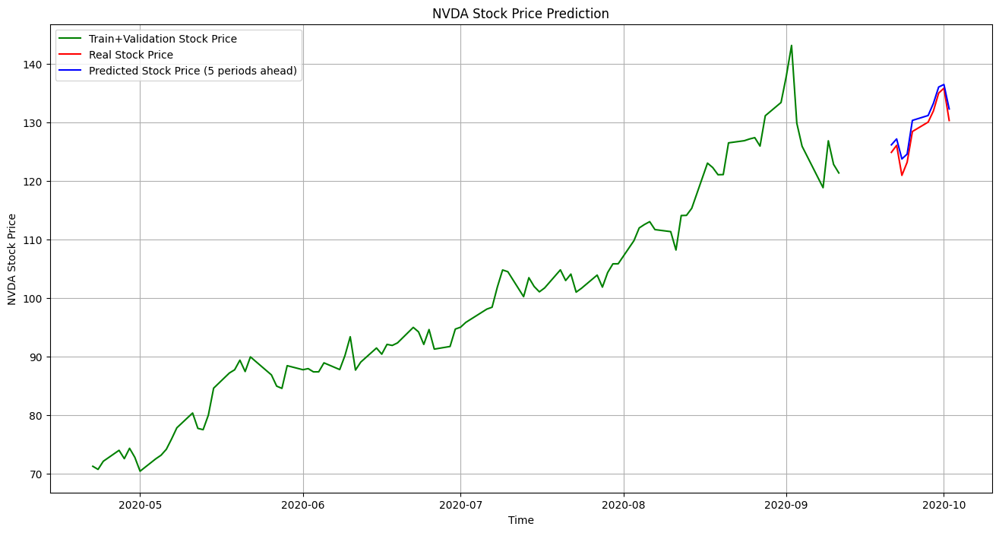

In [110]:
import matplotlib.pyplot as plt
plt.figure(figsize=(16,8))
test
plt.plot(train_validation.index[-100:], train_validation.tail(100), color='green', label = 'Train+Validation Stock Price')
plt.plot(test.index[5:PERIODS_TO_PREDICT+5], test[5:PERIODS_TO_PREDICT+5], color = 'red', label = 'Real Stock Price')
plt.plot(test.index[5:PERIODS_TO_PREDICT+5], predictions, color = 'blue', label = 'Predicted Stock Price (5 periods ahead)')
plt.title('NVDA Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('NVDA Stock Price')
plt.legend()
plt.grid(True)
plt.show()

## 1.4) [Фрагмент коду 5]Бінарне дерево рішень

In [111]:
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

### 1.4.1) Визначити фрейми даних та виконати очищення даних
* визначити X_train (датафрейм), X_test (датафрейм), y_train (серія), y_test (серія)
* замінити +-inf. на 0
* заповнити NaNs 0 (можна також опустити, але в нашому випадку буде втрачено багато даних)
* видалити 1-2% викидів (у кожному вимірі або тільки у змінній to_predict :: ми не будемо використовувати її для дерева рішень

In [112]:
# Дерево рішень не любить занадто великі та інформативні значення
# Дерево рішень не любить дані з великою кількістю шуму та високою дисперсією,
#  а також надмірно складні моделі, які можуть призвести до перенавчання (overfitting).
#  Щоб уникнути цього, важливо здійснювати налаштування гіперпараметрів, таких як глибина дерева,
#  та використовувати методи регуляризації, такі як обрізання (pruning).
import numpy as np

def remove_infinite_values(X):
    """
    Remove infinite values from the input array.

    Parameters:
    - X: Input array (NumPy array or array-like)

    Returns:
    - Array with infinite values removed
    """
    return X[np.isfinite(X).all(axis=1)]

# Приклад використання:
# Припустимо, що X - ваші вхідні дані
# filtered_X = remove_infinite_values(X)

In [113]:
# уважно дивіться, щоб 'count' було близьким до загальних значень (або потрібно замінити NaNs/видалити NaNs), а min/max не дорівнювало -+inf.
# це дасть вам ідею заглибитися в деякі особливості, щоб зрозуміти "природу" проблеми
pd.set_option('display.max_rows', None)

new_df[NUMERICAL+DUMMIES].describe().T

,count,mean,std,min,25%,50%,75%,max
growth_1d,182660.0,1.000868e+00,2.356674e-02,4.601100e-01,9.906461e-01,1.000473e+00,1.010716e+00,3.018887e+00
growth_3d,182630.0,1.002558e+00,3.947590e-02,4.170567e-01,9.842405e-01,1.002120e+00,1.020217e+00,3.018887e+00
growth_7d,182570.0,1.005875e+00,5.838238e-02,4.065424e-01,9.774801e-01,1.005428e+00,1.033406e+00,3.018887e+00
growth_30d,182225.0,1.025093e+00,1.180397e-01,3.054439e-01,9.622796e-01,1.022171e+00,1.083990e+00,3.993310e+00
growth_90d,181325.0,1.077823e+00,2.209361e-01,1.890111e-01,9.587507e-01,1.061788e+00,1.175049e+00,5.970002e+00
growth_365d,176915.0,1.350498e+00,6.155275e-01,9.783037e-02,1.015438e+00,1.239138e+00,1.527952e+00,9.819906e+00
growth_dax_1d,179673.0,1.000258e+00,1.419365e-02,8.776139e-01,9.937851e-01,1.000761e+00,1.007159e+00,1.114020e+00
growth_dax_3d,179673.0,1.000813e+00,2.417672e-02,8.374862e-01,9.891694e-01,1.002138e+00,1.013879e+00,1.144124e+00
growth_dax_7d,179673.0,1.001993e+00,3.587574e-02,7.318924e-01,9.843275e-01,1.004785e+00,1.021502e+00,1.232460e+00
growth_dax_30d,179673.0,1.008638e+00,7.189179e-02,6.263172e-01,9.727150e-01,1.014873e+00,1.050698e+00,1.288371e+00


In [114]:
# Розділіть дані на навчальні та тестові набори на основі дати поділу
features_list = NUMERICAL+DUMMIES
to_predict = 'is_positive_growth_5d_future'

train_df = new_df[new_df.split.isin(['train','validation'])].copy(deep=True)
test_df = new_df[new_df.split.isin(['test'])].copy(deep=True)

# ТІЛЬКИ числові Окремі ознаки та цільова змінна для навчальних та тестових наборів
# дата та тикер знадобляться пізніше при об'єднанні прогнозів до набору даних
X_train = train_df[features_list+[to_predict,'Date','Ticker']]
X_test = test_df[features_list+[to_predict,'Date','Ticker']]

print(f'length: X_train {X_train.shape},  X_test {X_test.shape}')


length: X_train (152846, 242),  X_test (29829, 242)


In [115]:
# Не може мати значень +-inf . Наприклад, ln(volume)=-inf при volume==0 => замінити на 0


# Вимкнути SettingWithCopyWarning
pd.options.mode.chained_assignment = None  # default='warn'

X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

# Треба якось заповнити NaNs
X_train.fillna(0, inplace=True)
X_test.fillna(0, inplace=True)

print(f'length: X_train_imputed {X_train.shape},  X_test_imputed {X_test.shape}')

length: X_train_imputed (152846, 242),  X_test_imputed (29829, 242)


In [116]:
# ви можете видалити 1-2% викидів на основі процентиля ==> не використовується в деревах рішень
def remove_outliers_percentile(X, lower_percentile=1, upper_percentile=99):
    """
        Видалити викиди з вхідного масиву на основі процентилів.


        Параметри:
        - X: Вхідний масив (масив NumPy або подібний до нього)
        - нижній_процентиль: Поріг нижнього процентиля (float, за замовчуванням=1)
        - upper_percentile: Поріг верхнього процентиля (float, за замовчуванням=99)


        Повертається:
        - Масив з видаленими викидами
    """
    lower_bound = np.percentile(X, lower_percentile, axis=0)
    upper_bound = np.percentile(X, upper_percentile, axis=0)
    mask = np.logical_and(np.all(X >= lower_bound, axis=1), np.all(X <= upper_bound, axis=1))
    return X[mask]

# Приклад використання:
# Припустимо, що X - ваші вхідні дані
# filtered_X = remove_outliers_percentile(X, lower_percentile=1, upper_percentile=99)

In [117]:
X_train_imputed = X_train # ми не будемо використовувати видалення викидів, щоб зберегти більше даних для навчання: remove_outliers_percentile(X_train)
X_test_imputed = X_test # ми не будемо використовувати видалення викидів, щоб зберегти більше даних для тестування: remove_outliers_percentile(X_test)

In [145]:
# однакова форма
print(f'length: X_train_imputed {X_train_imputed.shape}, X_test_imputed {X_test_imputed.shape}')

length: X_train_imputed (152846, 241), X_test_imputed (29829, 241)


In [121]:
y_train = X_train_imputed[to_predict]
y_test = X_test_imputed[to_predict]

# remove y_train, y_test from X_ dataframes
del X_train_imputed[to_predict]
del X_test_imputed[to_predict]

###1.4.2 Оцінка моделі дерева рішень

In [122]:
# ВХОДИ:
# X_train_imputed : Очистити DataFrame тільки з числовими характеристиками (потяг+періоди перевірки)
# X_test_imputed : Очистити dataFrame лише з числовими характеристиками (тестовими періодами)


# y_train : істинні значення для періоду поїзда
# y_test : істинні значення для тестового періоду

In [123]:
# функція оцінки/підбору (використовуючи фреймворк даних ознак X і того, що потрібно передбачити y) --> оптимізація загальної точності
# max_depth є гіперпараметром
def fit_decision_tree(X, y, max_depth=20):
# Ініціалізувати класифікатор дерева рішень
  clf = DecisionTreeClassifier(max_depth=max_depth)

# Підготуйте класифікатор до навчальних даних
  clf.fit(X, y)
  return clf, X.columns

In [124]:
%%time
# опускаємо 2 стовпці перед об'єднанням дерева, але ці стовпці знадобляться нам пізніше для з'єднань
clf_20, train_columns = fit_decision_tree(X=X_train_imputed.drop(['Date','Ticker'],axis=1),
                           y=y_train,
                           max_depth=20)

CPU times: user 39.5 s, sys: 153 ms, total: 39.6 s
Wall time: 43.8 s


In [125]:
%%time
clf_10, train_columns = fit_decision_tree(X=X_train_imputed.drop(['Date','Ticker'],axis=1),
                           y=y_train,
                           max_depth=10)

CPU times: user 22.2 s, sys: 167 ms, total: 22.4 s
Wall time: 23.1 s


In [126]:
# ЗАВДАННЯ 3: Тренуйтеся тільки на тренувальному наборі даних, експериментуйте з деревами глибиною 1.20 --> знайдіть найкраще на VALID наборі даних
# для "найкращої" моделі дерева: знайти точність на множині TEST

In [ ]:
### 1.4.3 Висновок для дерева рішень

def predict_decision_tree(clf:DecisionTreeClassifier, df_X:pd.DataFrame, y_true: pd.Series):
# Прогнозування цільової змінної на тестових даних
  y_pred = clf.predict(df_X)

  max_depth = clf.tree_.max_depth
# Вивести максимальну глибину
  print("Maximum depth of the decision tree:", max_depth)

# Розрахувати точність/прецизійність моделі
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  print(f'Accuracy ={accuracy}, precision = {precision}')

# результуючий df
  result_df = pd.concat([df_X, y_true, pd.Series(y_pred, index=df_X.index, name='pred_')], axis=1)

  return result_df

pred20 = predict_decision_tree(clf_20, X_test_imputed.drop(['Date','Ticker'],axis=1), y_test)

# Передбачення дерева рішень глибиною "20"
pred20.pred_.value_counts()

pred10 = predict_decision_tree(clf_10, X_test_imputed.drop(['Date','Ticker'],axis=1), y_test)

pred10.tail()

X_test_imputed.join(pred10['pred_']).head()

# Прогнози дерева рішень глибиною "10": набагато більше "позитивних" прогнозів
pred10.pred_.value_counts()

# визначити новий DF з таким самим індексом (використовується для об'єднань)
pred20_df = pred20[['pred_']].rename(columns={'pred_': 'pred_tree_clf20'})
pred20_df.head(1)

# визначити новий DF з таким самим індексом (використовується для об'єднань)
pred10_df = pred10[['pred_']].rename(columns={'pred_': 'pred_tree_clf10'})
pred10_df.head(1)

### 1.4.4 Важливість функцій та деревоподібна візуалізація верхніх рівнів (для clf10)

# візуалізація: дерево рішень для декількох рівнів (змінна max_depth)
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Припускаючи, що clf є вашим навченим класифікатором DecisionTreeClassifier
plt.figure(figsize=(20,10))  # Встановити розмір фігури
plot_tree(clf_10,
          filled=True,
          feature_names=train_columns,
          class_names=['Negative', 'Positive'],
          max_depth=2)
plt.show()

# Функція важливості для прогнозування майбутніх прибутків (на основі класифікатора)
# отримати значення ознаки з 'clf' (класифікатор) та 'train_columns' (назви стовпців)

def get_importances(clf, train_columns):
  # Припускаючи, що clf є вашим навченим класифікатором дерева рішень
  feature_importance = clf.feature_importances_

 # Припустимо, що X_train - це ваші навчальні функції.
  feature_names = train_columns

 # Створіть DataFrame для зберігання важливості функції.
  feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})

  # Відсортуйте DataFrame за важливістю у порядку спадання
  feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

  # Вивести або відобразити важливість функції DataFrame
  # print(feature_importance_df).
  return feature_importance_df

get_importances(clf_10, train_columns).head(10)

get_importances(clf_20, train_columns).head(10)

### 1.4.5 Об'єднати з оригінальним df для прогнозів (тільки при прогнозуванні на тестовому наборі даних)

# поточні прогнози від MANUAL
PREDICTIONS

new_df.head()

# індекс у df не є унікальним
np.sort(new_df.groupby(new_df.index).split.count())

# важко об'єднати з pred10_df - оскільки індекс зовсім інший
pred10_df.head()

In [144]:
# ЗАВДАННЯ 4: Об'єднайте прогнози з оригінальним фреймом даних (визначте новий стовпець):
# так, щоб існували стовпці pred_tree_clf10 І pred_tree_clf20